<a href="https://colab.research.google.com/github/MarMarhoun/freelance_work/blob/main/side_projects/NLP_projs/phishing_urls_detection/phishing_urls_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Description:

Phishing is a form of fraud in which the attacker tries to learn sensitive information such as login credentials or account information by sending as a reputable entity or person in email or other communication channels.

Typically a victim receives a message that appears to have been sent by a known contact or organization. The message contains malicious software targeting the user’s computer or has links to direct victims to malicious websites in order to trick them into divulging personal and financial information, such as passwords, account IDs or credit card details.

## Dataset Description:

URLs dataset with features built and used for evaluation in the paper "[PhishStorm](https://research.aalto.fi/en/datasets/phishstorm-phishing-legitimate-url-dataset): Detecting Phishing with Streaming Analytics" published in IEEE TNSM.
The dataset contains 96,018 URLs: 48,009 legitimate URLs and 48,009 phishing URLs.

This is a CSV file where the "domain" column provides a unique identifier for each entry (which is actually a URL). The "label" column provides the domain entry status, 0: legitimate / 1:phishing.


> # Load and Preprocess the dataset

In [2]:
# import the necessary libraries

import zipfile
import pandas as pd
import numpy as np
from tqdm import tqdm

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn import metrics
from sklearn.metrics import recall_score, precision_score, accuracy_score
from sklearn.model_selection import train_test_split


path_to_zip_file = "/content/urlset.csv.zip"
directory_to_extract_to= "/content/"

data_url = '/content/urlset.csv'


In [ ]:
# Import the dataset 
!wget https://research.aalto.fi/files/16859732/urlset.csv.zip

--2023-02-27 21:35:36--  https://research.aalto.fi/files/16859732/urlset.csv.zip
Resolving research.aalto.fi (research.aalto.fi)... 54.74.68.52, 34.248.98.230, 34.253.178.11
Connecting to research.aalto.fi (research.aalto.fi)|54.74.68.52|:443... connected.
HTTP request sent, awaiting response... 302 302
Location: https://acris.aalto.fi/ws/portalfiles/portal/16859732/urlset.csv.zip [following]
--2023-02-27 21:35:36--  https://acris.aalto.fi/ws/portalfiles/portal/16859732/urlset.csv.zip
Resolving acris.aalto.fi (acris.aalto.fi)... 130.233.208.8
Connecting to acris.aalto.fi (acris.aalto.fi)|130.233.208.8|:443... connected.
HTTP request sent, awaiting response... 200 200
Length: unspecified [multipart/x-zip]
Saving to: ‘urlset.csv.zip’

urlset.csv.zip          [    <=>             ]   3.24M  2.75MB/s    in 1.2s    

2023-02-27 21:35:39 (2.75 MB/s) - ‘urlset.csv.zip’ saved [3400239]



In [ ]:
# Decompress the dataset

with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)                                 #  encoding ='ISO-8859-1')#  engine='python') # encoding='unicode_escape') # encoding='latin1')  #, errors='ignore'

In [ ]:
zf = zipfile.ZipFile(path_to_zip_file) 

text_files = zf.infolist()
text_files

[<ZipInfo filename='urlset.csv' compress_type=deflate filemode='-rwxrwxrwx' external_attr=0x4000 file_size=12283023 compress_size=3400077>]

In [ ]:
# Encoding type of the dataset

import chardet    
rawdata = open(data_url, 'rb').read()
result = chardet.detect(rawdata)
charenc = result['encoding']
print(charenc)

Windows-1254


In [ ]:
# RAW dataset

with open(data_url, 'rb') as f:
  text = f.read()

In [ ]:
text

b'domain,ranking,mld_res,mld.ps_res,card_rem,ratio_Rrem,ratio_Arem,jaccard_RR,jaccard_RA,jaccard_AR,jaccard_AA,jaccard_ARrd,jaccard_ARrem,label\n"nobell.it/70ffb52d079109dca5664cce6f317373782/login.SkyPe.com/en/cgi-bin/verification/login/70ffb52d079109dca5664cce6f317373/index.php?cmd=_profile-ach&outdated_page_tmpl=p/gen/failed-to-load&nav=0.5.1&login_access=1322408526",10000000,1.0,0.0,18,107.611111,107.277778,0,0,0,0,0.8,0.795729,1.0\n"www.dghjdgf.com/paypal.co.uk/cycgi-bin/webscrcmd=_home-customer&nav=1/loading.php",10000000,0.0,0.0,11,150.636364,152.272727,0,0,0,0,0,0.768577,1.0\n"serviciosbys.com/paypal.cgi.bin.get-into.herf.secure.dispatch35463256rzr321654641dsf654321874/href/href/href/secure/center/update/limit/seccure/4d7a1ff5c55825a2e632a679c2fd5353/",10000000,0.0,0.0,14,73.5,72.642857,0,0,0,0,0,0.726582,1.0\n"mail.printakid.com/www.online.americanexpress.com/index.html",10000000,0.0,0.0,6,562,590.666667,0,0,0,0,0,0.85964,1.0\n"thewhiskeydregs.com/wp-content/themes/widescreen/

In [ ]:
# Preprocess the raw-data

encodingError = 0
lineCounter = 0

with open(data_url, 'r', newline='\n', encoding='utf-8') as inFile, open('output.csv', 'w') as outFile:
    while True:
        lineCounter += 1
        try:
            line = inFile.readline()
        except UnicodeDecodeError as e:
            encodingError += 1
            print(f'encoding error in line {lineCounter}, error message: {e}')
            continue
        if not line:
            break
        outFile.write(line)

print(f'total skipped lines {encodingError}, due to encoding error.')

encoding error in line 18232, error message: 'utf-8' codec can't decode byte 0xad in position 122: invalid start byte
encoding error in line 18233, error message: 'utf-8' codec can't decode byte 0xd5 in position 2: invalid continuation byte
total skipped lines 2, due to encoding error.


In [3]:
# Load the Data and take a look at the first samples

df = pd.read_csv("/content/output.csv")

df.head()


,domain,ranking,mld_res,mld.ps_res,card_rem,ratio_Rrem,ratio_Arem,jaccard_RR,jaccard_RA,jaccard_AR,jaccard_AA,jaccard_ARrd,jaccard_ARrem,label
0,nobell.it/70ffb52d079109dca5664cce6f317373782/...,10000000.0,1.0,0.0,18,107.611111,107.277778,0.0,0.0,0.0,0.0,0.8,0.795729,1.0
1,www.dghjdgf.com/paypal.co.uk/cycgi-bin/webscrc...,10000000.0,0.0,0.0,11,150.636364,152.272727,0.0,0.0,0.0,0.0,0.0,0.768577,1.0
2,serviciosbys.com/paypal.cgi.bin.get-into.herf....,10000000.0,0.0,0.0,14,73.500000,72.642857,0.0,0.0,0.0,0.0,0.0,0.726582,1.0
3,mail.printakid.com/www.online.americanexpress....,10000000.0,0.0,0.0,6,562.000000,590.666667,0.0,0.0,0.0,0.0,0.0,0.859640,1.0
4,thewhiskeydregs.com/wp-content/themes/widescre...,10000000.0,0.0,0.0,8,29.000000,24.125000,0.0,0.0,0.0,0.0,0.0,0.748971,1.0


In [4]:
# replace null values with nan
df.replace('',np.nan,inplace=True)
df.replace(' ',np.nan,inplace=True)
df.drop('domain', axis=1, inplace=True)

In [5]:
# drop nan values in the data
df.dropna(axis=0, how='any', inplace=True)

In [ ]:
# Data columns

df.columns

Index(['domain', 'ranking', 'mld_res', 'mld.ps_res', 'card_rem', 'ratio_Rrem',
       'ratio_Arem', 'jaccard_RR', 'jaccard_RA', 'jaccard_AR', 'jaccard_AA',
       'jaccard_ARrd', 'jaccard_ARrem', 'label'],
      dtype='object')

In [ ]:
# Infos of the data

df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 95910 entries, 0 to 95910
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   domain         95910 non-null  object 
 1   ranking        95910 non-null  float64
 2   mld_res        95910 non-null  float64
 3   mld.ps_res     95910 non-null  float64
 4   card_rem       95910 non-null  int64  
 5   ratio_Rrem     95910 non-null  float64
 6   ratio_Arem     95910 non-null  float64
 7   jaccard_RR     95910 non-null  float64
 8   jaccard_RA     95910 non-null  float64
 9   jaccard_AR     95910 non-null  float64
 10  jaccard_AA     95910 non-null  float64
 11  jaccard_ARrd   95910 non-null  float64
 12  jaccard_ARrem  95910 non-null  float64
 13  label          95910 non-null  float64
dtypes: float64(12), int64(1), object(1)
memory usage: 11.0+ MB


In [ ]:
# Describe the data

df.describe().T

,count,mean,std,min,25%,50%,75%,max
ranking,95910.0,5.888698e+06,4.878419e+06,1.0,25469.000000,1.000000e+07,1.000000e+07,1.000000e+07
mld_res,95910.0,4.556146e-01,4.980286e-01,0.0,0.000000,0.000000e+00,1.000000e+00,1.000000e+00
mld.ps_res,95910.0,2.024606e-01,4.018358e-01,0.0,0.000000,0.000000e+00,0.000000e+00,1.000000e+00
card_rem,95910.0,4.573850e+00,4.343267e+00,0.0,2.000000,3.000000e+00,6.000000e+00,5.800000e+01
ratio_Rrem,95910.0,1.352627e+02,1.609953e+02,0.0,43.000000,1.040217e+02,1.741429e+02,5.507000e+03
ratio_Arem,95910.0,1.385546e+02,1.754875e+02,0.0,39.666667,1.033333e+02,1.783250e+02,6.097000e+03
jaccard_RR,95910.0,4.010643e-03,2.874748e-02,0.0,0.000000,0.000000e+00,0.000000e+00,1.000000e+00
jaccard_RA,95910.0,3.768989e-03,2.447878e-02,0.0,0.000000,0.000000e+00,0.000000e+00,9.166670e-01
jaccard_AR,95910.0,3.367796e-03,2.379512e-02,0.0,0.000000,0.000000e+00,0.000000e+00,1.000000e+00
jaccard_AA,95910.0,3.644755e-03,2.826012e-02,0.0,0.000000,0.000000e+00,0.000000e+00,1.000000e+00


In [6]:
# Scale the dataset

from sklearn.preprocessing import MinMaxScaler


col_scale = [ 'ranking', 'card_rem', 'ratio_Rrem', 'ratio_Arem']

scl = MinMaxScaler()

temp = scl.fit_transform(df[col_scale])
df[col_scale]= temp




In [6]:
# Describe the data after scaling

df.describe().T

,count,mean,std,min,25%,50%,75%,max
ranking,95910.0,0.588870,0.487842,0.0,0.002547,1.000000,1.000000,1.000000
mld_res,95910.0,0.455615,0.498029,0.0,0.000000,0.000000,1.000000,1.000000
mld.ps_res,95910.0,0.202461,0.401836,0.0,0.000000,0.000000,0.000000,1.000000
card_rem,95910.0,0.078859,0.074884,0.0,0.034483,0.051724,0.103448,1.000000
ratio_Rrem,95910.0,0.024562,0.029235,0.0,0.007808,0.018889,0.031622,1.000000
ratio_Arem,95910.0,0.022725,0.028783,0.0,0.006506,0.016948,0.029248,1.000000
jaccard_RR,95910.0,0.004011,0.028747,0.0,0.000000,0.000000,0.000000,1.000000
jaccard_RA,95910.0,0.003769,0.024479,0.0,0.000000,0.000000,0.000000,0.916667
jaccard_AR,95910.0,0.003368,0.023795,0.0,0.000000,0.000000,0.000000,1.000000
jaccard_AA,95910.0,0.003645,0.028260,0.0,0.000000,0.000000,0.000000,1.000000


> # Exploratory Data Analysis (EDA)


legitimate:  48009 , phishing:  47901


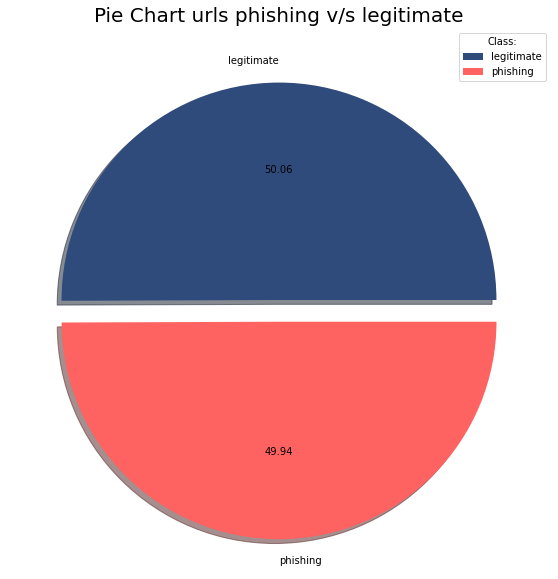

In [ ]:
# Check the class imbalance:
##
# 0: legitimate 
# 1: phishing
#

legitimate = df[df['label']==0]['label'].count()
phishing = df[df['label']==1]['label'].count()
print('legitimate: ',legitimate,', phishing: ',phishing)

#
my_colors = ['#2f4b7c','#ff6361']   #lightblue      # 'lightsteelblue'] #, 'silver']
labels  = ['legitimate','phishing']
my_explode = (0, 0.1)
plt.pie([legitimate,phishing], labels=labels,autopct='%.2f', startangle=0, shadow=True, colors=my_colors , explode=my_explode,  ) # colors='red',labeldistance=1)  # 
plt.title('Pie Chart urls phishing v/s legitimate', fontsize = 20)
plt.legend(title = 'Class:', loc='best' )
plt.gcf().set_size_inches((18, 10))
plt.show()

In [ ]:
#  # Checking Imbalance in Data

%matplotlib inline
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff

# Defining all our palette colours.
primary_blue = "#496595"
primary_blue2 = "#85a1c1"
primary_grey2 = "#3f4d63"
primary_grey = "#c6ccd8"
primary_black = "#202022"
primary_bgcolor = "#f4f0ea"
primary_red = "#ff6361"

primary_green = px.colors.qualitative.Plotly[2]

In [ ]:
# Now we are going to take a look about the target distribution and the messages length.

balance_counts = df.groupby('label')['label'].agg('count').values
balance_counts

array([48009, 47901])

In [ ]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=['legitimate'],
    y=[balance_counts[0]],
    name='legitimate',
    text=[balance_counts[0]],
    textposition='auto',
    marker_color=primary_blue
))
fig.add_trace(go.Bar(
    x=['phishing'],
    y=[balance_counts[1]],
    name='phishing',
    text=[balance_counts[1]],
    textposition='auto',
    marker_color=primary_grey
))
fig.update_layout(
    font_family="Times New Roman",
    title = {
         'text': "Target distribution - legitimate vs phishing",
         'y':0.9, # new
         'x':0.5,
         'xanchor': 'center',
         'yanchor': 'top' # new
        },
    title_font_family="Times New Roman",
    font=dict(
        #family="Courier New, monospace",
        size=20)  # Set the font size here
        #color="RebeccaPurple"
    
    #title=' Target distribution by Chrun '
)
fig.show()

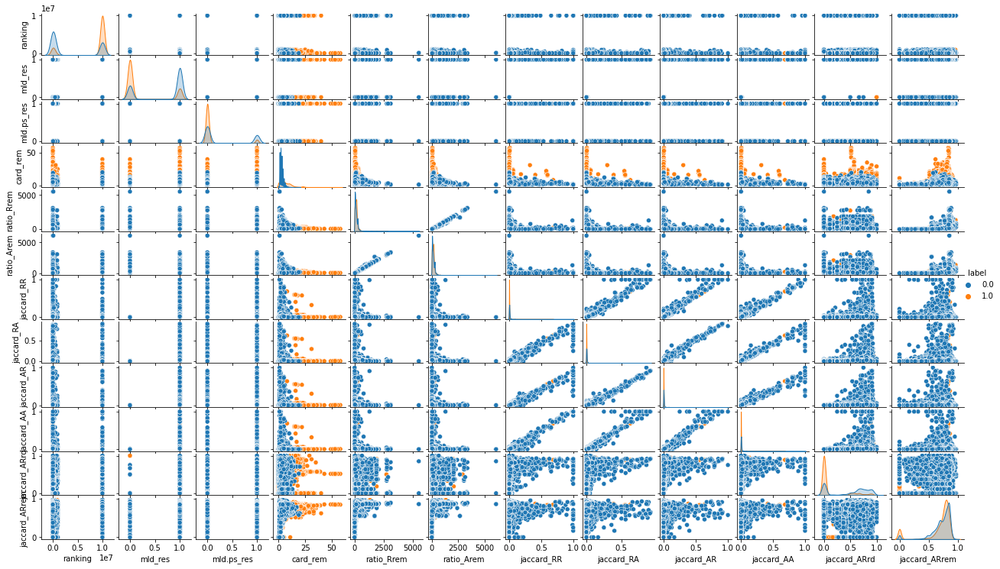

In [ ]:
# Checking Pair Plots:

# Building pair plot
vars = ['ranking', 'mld_res', 'mld.ps_res', 'card_rem', 'ratio_Rrem',
       'ratio_Arem', 'jaccard_RR', 'jaccard_RA', 'jaccard_AR', 'jaccard_AA',
       'jaccard_ARrd', 'jaccard_ARrem']

sns.pairplot(df,vars=vars,hue='label')
plt.gcf().set_size_inches((18, 10))

In [ ]:
# Check Feature Correlation:
## Building a correlation matrix

sns.set(style="white", font_scale =1.5)
corr = df.corr()
corr

,ranking,mld_res,mld.ps_res,card_rem,ratio_Rrem,ratio_Arem,jaccard_RR,jaccard_RA,jaccard_AR,jaccard_AA,jaccard_ARrd,jaccard_ARrem,label
ranking,1.000000,-0.672882,-0.569167,0.157850,-0.007072,-0.010714,-0.135553,-0.148778,-0.137974,-0.122152,-0.622743,-0.014399,0.500193
mld_res,-0.672882,1.000000,0.549961,-0.150913,-0.009000,-0.005056,0.152477,0.168272,0.154681,0.140952,0.925063,-0.000508,-0.485428
mld.ps_res,-0.569167,0.549961,1.000000,0.000209,-0.019370,-0.013543,0.157608,0.180018,0.165721,0.148374,0.447427,-0.028677,-0.303274
card_rem,0.157850,-0.150913,0.000209,1.000000,0.018066,0.015141,-0.022189,-0.022367,-0.022898,-0.020845,-0.163122,0.301485,0.429402
ratio_Rrem,-0.007072,-0.009000,-0.019370,0.018066,1.000000,0.996549,-0.007161,-0.003285,-0.003043,-0.002132,0.007670,0.395472,-0.018244
ratio_Arem,-0.010714,-0.005056,-0.013543,0.015141,0.996549,1.000000,-0.006973,-0.003156,-0.002921,-0.002116,0.009661,0.376406,-0.022769
jaccard_RR,-0.135553,0.152477,0.157608,-0.022189,-0.007161,-0.006973,1.000000,0.976218,0.978444,0.976459,0.163547,0.020024,-0.107495
jaccard_RA,-0.148778,0.168272,0.180018,-0.022367,-0.003285,-0.003156,0.976218,1.000000,0.988264,0.975575,0.183150,0.026819,-0.118369
jaccard_AR,-0.137974,0.154681,0.165721,-0.022898,-0.003043,-0.002921,0.978444,0.988264,1.000000,0.975282,0.173926,0.024451,-0.107519
jaccard_AA,-0.122152,0.140952,0.148374,-0.020845,-0.002132,-0.002116,0.976459,0.975575,0.975282,1.000000,0.158687,0.019697,-0.100335


<ipython-input-20-b0445fc90f07>:1: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



<AxesSubplot:>

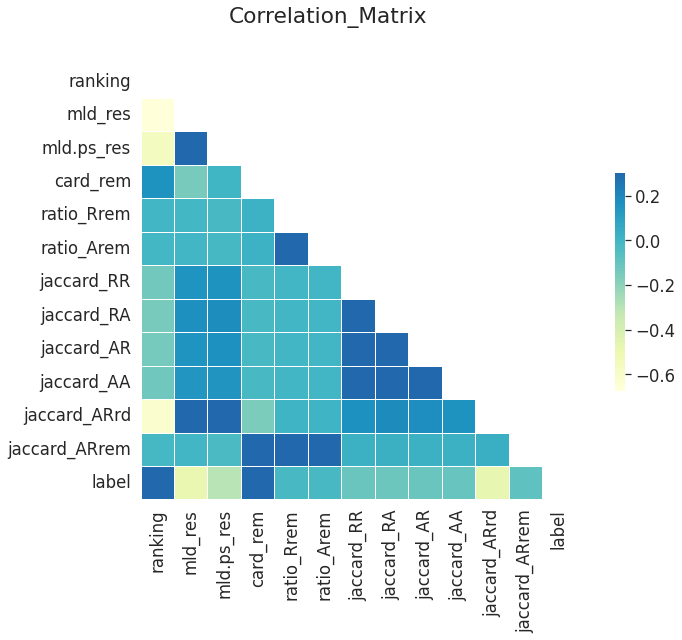

In [ ]:
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f,ax = plt.subplots(figsize=(14,8))
f.suptitle('Correlation_Matrix')

#cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap='YlGnBu', vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

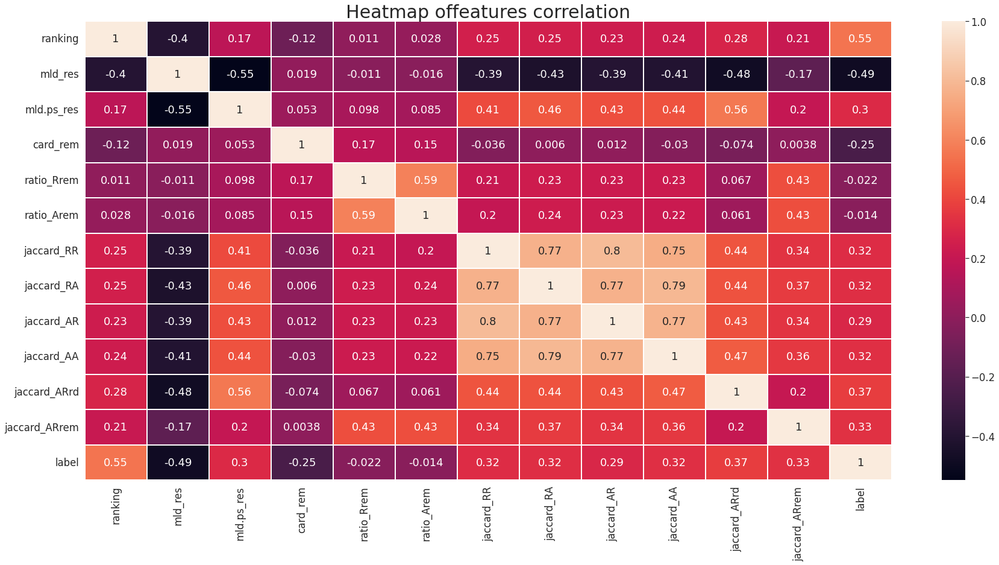

In [ ]:
# Another plot for correlation between features

sns.set(style="white", font_scale =1.5)
corr3 = df.apply(lambda x: pd.factorize(x)[0]).corr()
sns.heatmap(corr3, xticklabels = corr3.columns, yticklabels = corr3.columns, linewidths=0.2, annot = True)
plt.title('Heatmap offeatures correlation',  fontsize=30)
plt.gcf().set_size_inches((30, 14))

> # Training section

The prepared dataset will be fetched to the model for training and testing purpose.

In [7]:
# Split the dataset

X = df.drop("label",axis=1)
y = df[["label"]]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2,shuffle=True, random_state=5)


> ## XGBoost Train


In [12]:
# fit model 

xgb_est = XGBClassifier()
xgb_est.fit(X_train, y_train)

/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


XGBClassifier()

In [13]:
y_pred_class = xgb_est.predict(X_test)
y_pred_train = xgb_est.predict(X_train)

print('XGB Train Accuracy: {}'.format(accuracy_score(y_train, y_pred_train)))
print('XGB Test Acuuracy: {}'.format(accuracy_score(y_test, y_pred_class)))

XGB Train Accuracy: 0.8807866750078198
XGB Test Acuuracy: 0.8794703367740591


In [14]:
# make predictions 
y_pred_proba = xgb_est.predict_proba(X_test)
y_pred = xgb_est.predict(X_test)

y_test["predicted"] = y_pred
y_test["predicted_proba"] = y_pred_proba[:,1]
y_test.head()

,label,predicted,predicted_proba
76712,0.0,1.0,0.528612
74961,0.0,0.0,0.013870
24886,1.0,1.0,0.609190
24305,1.0,1.0,0.705081
67472,0.0,0.0,0.023502


> ## SVM Train

     

In [43]:
# fit model



X_train1, y_train1 = X_train.copy(), y_train.copy()

svm_est = SVC( gamma='auto', probability=True) # kernel='linear', 
svm_est.fit(X_train1, y_train1)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



SVC(gamma='auto', probability=True)

In [45]:
X_test1, y_test1 = X_test.copy(), y_test.copy()

y_pred_class = svm_est.predict(X_test1)
y_pred_train = svm_est.predict(X_train1)



SVM Train Accuracy: 0.8120242936085914


In [46]:
print('SVM Train Accuracy: {}'.format(accuracy_score(y_train1, y_pred_train)))
print('SVM Test Accuracy: {}'.format(accuracy_score(y_test1.label, y_pred_class)))

SVM Train Accuracy: 0.8120242936085914
SVM Test Accuracy: 0.8084662704618913


Text(0.5, 0, 'Permutation Importance')

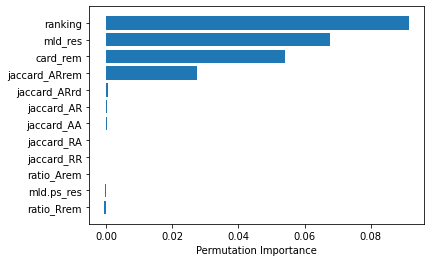

In [47]:
from sklearn.inspection import permutation_importance


perm_importance = permutation_importance(svm_est, X_test1, y_test1.label)


features = X.columns

sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(features[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

In [49]:
# make predictions 
y_pred_proba1 = svm_est.predict_proba(X_test1)
y_pred1 = svm_est.predict(X_test1)

y_test1["predicted"] = y_pred1
y_test1["predicted_proba"] = y_pred_proba1[:,1]
y_test1.head()

,label,predicted,predicted_proba
76712,0.0,1.0,0.748794
74961,0.0,0.0,0.065330
24886,1.0,1.0,0.758222
24305,1.0,1.0,0.713162
67472,0.0,0.0,0.075002


> ## Random Forest Train



In [8]:
# fit model 

X_train2, y_train2 = X_train.copy(), y_train.copy()

rf_est = RandomForestClassifier(max_depth=10, random_state=0)
rf_est.fit(X_train2, y_train2)

<ipython-input-8-f1bc43c0dfa7>:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_est.fit(X_train2, y_train2)


RandomForestClassifier(max_depth=10, random_state=0)

In [9]:

X_test2, y_test2 = X_test.copy(), y_test.copy()

y_pred_class = rf_est.predict(X_test2)
y_pred_train = rf_est.predict(X_train2)

print('Random Forest Train Accuracy: {}'.format(accuracy_score(y_train2, y_pred_train)))
print('Random Forest Test Acuuracy: {}'.format(accuracy_score(y_test2, y_pred_class)))

Random Forest Train Accuracy: 0.9054582421019706
Random Forest Test Acuuracy: 0.8992805755395683


In [10]:
# make predictions 
y_pred_proba = rf_est.predict_proba(X_test2)
y_pred = rf_est.predict(X_test2)

y_test2["predicted"] = y_pred
y_test2["predicted_proba"] = y_pred_proba[:,1]
y_test2.head()
     

,label,predicted,predicted_proba
76712,0.0,0.0,0.471264
74961,0.0,0.0,0.005532
24886,1.0,1.0,0.639901
24305,1.0,1.0,0.665383
67472,0.0,0.0,0.003171


> # Evaluation section

After the model was trained and tested, we want to measure the performance of our model. Here we will plot the confusion matrix, AUC, proba disribution, and feature importance from the model.

In [19]:
# Writing a function for getting auc score for validation
scores_model = []
def roc_auc(predictions,target):
    '''
    This methods returns the AUC Score when given the Predictions
    and Labels
    '''
    
    fpr, tpr, thresholds = metrics.roc_curve(target, predictions)
    roc_auc = metrics.auc(fpr, tpr)
    return roc_auc

> ## XGBoost Evaluation

In [15]:
# feature_importance

feature_importance = pd.DataFrame()
feature_importance["feature"] = X.columns
feature_importance["value"] = xgb_est.feature_importances_
feature_importance = feature_importance.sort_values("value", ascending=False).reset_index(drop=True)


In [56]:
metrics.roc_auc_score( y_test.label, y_test.predicted_proba )

0.9543453292829129

In [20]:
scores_model.append({'Model': 'XGBoost','AUC_Score': roc_auc( y_test.predicted_proba,y_test.label)}) 

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


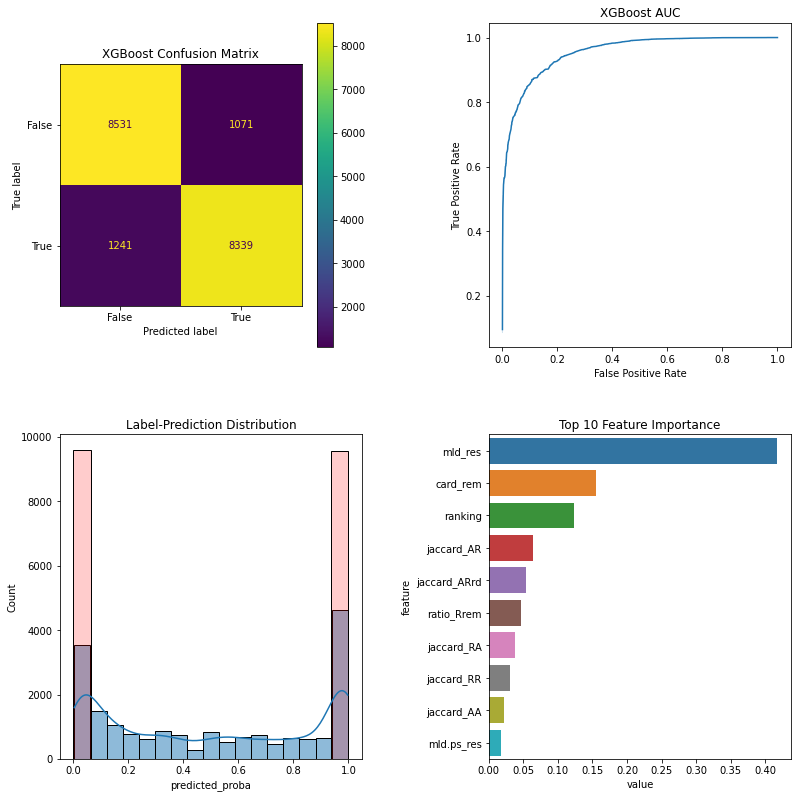

In [17]:
## ref: https://www.kaggle.com/code/irfandahusnisahid/customer-churn-prediction-using-xgboost


fig,ax = plt.subplots(2,2,figsize=(12,12))
confusion_matrix = metrics.confusion_matrix(y_test.label, y_test.predicted)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot(ax=ax[0,0])
ax[0,0].set_title("XGBoost Confusion Matrix")

fpr, tpr, _ = metrics.roc_curve(y_test.label, y_test.predicted_proba)
sns.lineplot(fpr,tpr,ax=ax[0,1])
ax[0,1].set_xlabel('False Positive Rate')
ax[0,1].set_ylabel('True Positive Rate')
ax[0,1].set_title("XGBoost AUC")

sns.histplot(y_test.predicted_proba,kde=True,ax=ax[1,0])
sns.histplot(y_test.label,kde=False,ax=ax[1,0], color="red",alpha=0.2)
ax[1,0].set_title("Label-Prediction Distribution")

sns.barplot(data=feature_importance.iloc[0:10],x="value",y="feature",ax=ax[1,1])
ax[1,1].set_title("Top 10 Feature Importance")

fig.tight_layout(pad=4.0)
plt.show()

In [21]:
y_test

,label,predicted,predicted_proba
76712,0.0,1.0,0.528612
74961,0.0,0.0,0.013870
24886,1.0,1.0,0.609190
24305,1.0,1.0,0.705081
67472,0.0,0.0,0.023502
...,...,...,...
44765,1.0,1.0,0.989224
89610,0.0,0.0,0.277491
64237,0.0,0.0,0.026351
49437,0.0,0.0,0.022872


In [24]:
# Predict using training and testing data and display the accuracy, f-1 score, precision for Positive and Negative Sentiment Classifiers 

## If you're using the second cleaning, you can use the following command:
#xgb_predictions = xgb_est.predict(tvec.transform(X_test_cleaned))   

## Otherwise, use these commands:
xgb_preds = xgb_est.predict(X_test)

report = metrics.classification_report(y_test.label,xgb_preds, output_dict=True)
data_report = pd.DataFrame(report).transpose().round(2)
cm = sns.light_palette("blue", as_cmap=True)
data_report.style.background_gradient(cmap=cm)

,precision,recall,f1-score,support
0.0,0.870000,0.890000,0.880000,9602.000000
1.0,0.890000,0.870000,0.880000,9580.000000
accuracy,0.880000,0.880000,0.880000,0.880000
macro avg,0.880000,0.880000,0.880000,19182.000000
weighted avg,0.880000,0.880000,0.880000,19182.000000


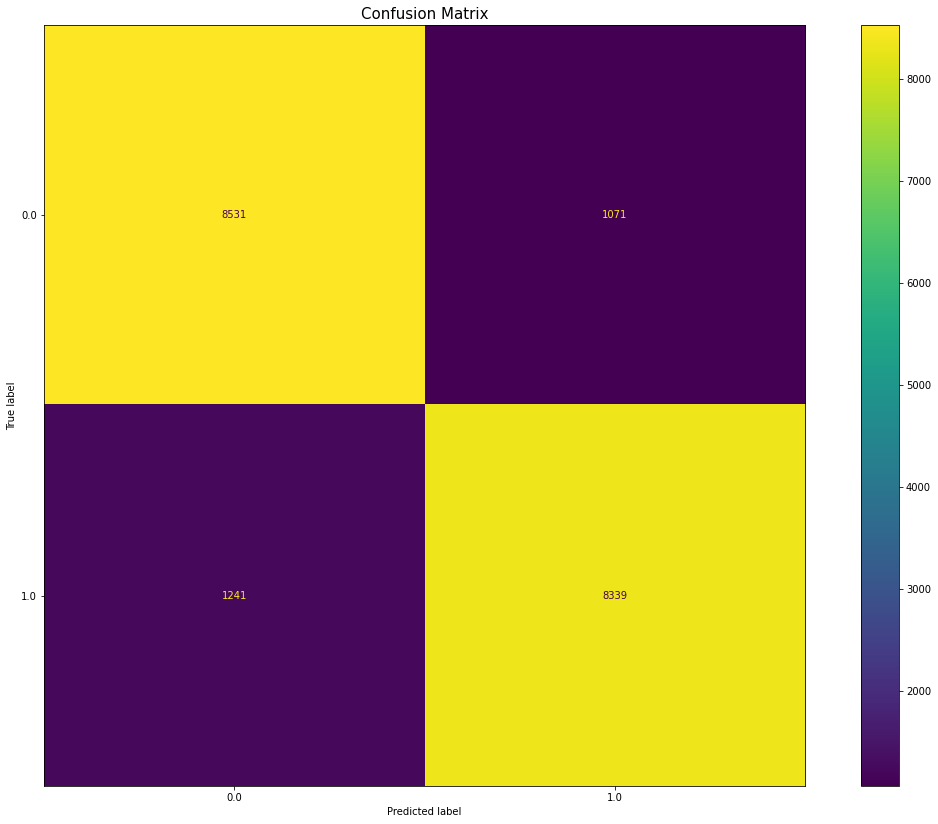

In [25]:
# First type of Confusion matrix

cm = metrics.confusion_matrix(y_test.label, xgb_preds, labels=xgb_est.classes_)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm,  display_labels=xgb_est.classes_ ) #cmap='RdBu_r'

disp.plot()
plt.title('Confusion Matrix',  fontsize = 15)
plt.gcf().set_size_inches((20, 14))
plt.show()

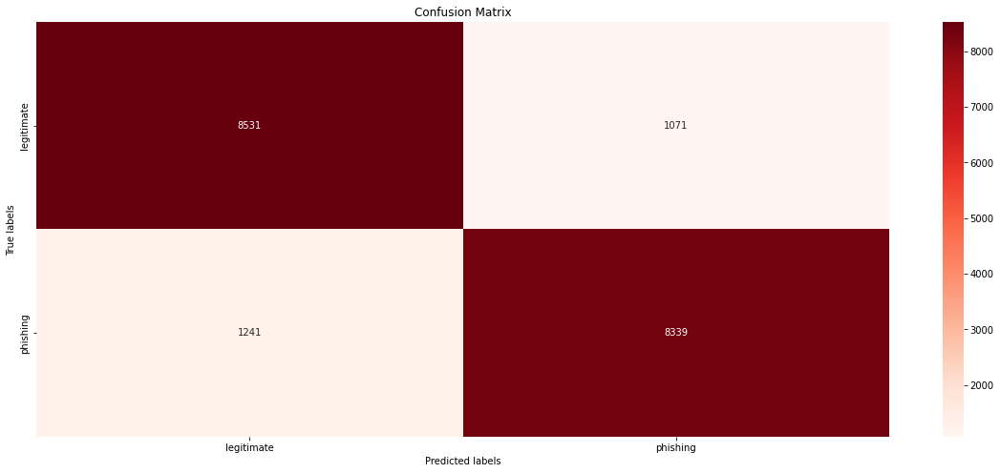

In [28]:
# Second type of confusion matrix

ax= plt.subplot()
cm= metrics.confusion_matrix(y_test.label,xgb_preds)
sns.heatmap(cm, annot=True, fmt='g', ax=ax,cmap='Reds');  
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(['legitimate', 'phishing']); ax.yaxis.set_ticklabels(['legitimate', 'phishing']);
plt.gcf().set_size_inches((20, 8))
plt.show()

In [29]:
import plotly.figure_factory as ff

x_axes = ['legitimate', 'phishing']
y_axes =  ['phishing', 'legitimate']

def conf_matrix(z, x=x_axes, y=y_axes):
    
    z = np.flip(z, 0)

    # change each element of z to type string for annotations
    z_text = [[str(y) for y in x] for x in z]

    # set up figure 
    fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z_text, colorscale='Viridis')

    # add title
    fig.update_layout(title_text='<b>Confusion matrix</b>',
                      xaxis = dict(title='Predicted value'),
                      yaxis = dict(title='Real value')
                     )

    # add colorbar
    fig['data'][0]['showscale'] = True
    
    return fig

In [31]:
# Third type of confusion Matrix

conf_matrix(metrics.confusion_matrix(y_test.label, xgb_preds))


In [ ]:
'''
For CM:

supported values are:
'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 
'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 
'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 
'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 
'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 
'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 
'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 
'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 
'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 
'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 
'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 
'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 
'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r',
'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magm..





'''

> #### Save the XGB model 

In [32]:
import pickle 


filename = "xgb_est_ph.sav"

# Save the trained model as a pickle string.
pickle.dump(xgb_est,open(filename, "wb") )

## Load the pickled model
xgb_from_pickle = pickle.load(open(filename, "rb"))


# Use the loaded pickled model to make predictions
print("*************  The model results:  ***********\n", xgb_from_pickle.predict(X_test))




*************  The model results:  ***********
 [1. 0. 1. ... 0. 0. 0.]


> ## SVM evaluation

In [50]:
# For SVM model, I used permutation_importance instead. Because feature importance method requires tree based algorithm


permutation_importance = pd.DataFrame()

features = X.columns
sorted_idx = perm_importance.importances_mean.argsort()

permutation_importance["feature"]= features[sorted_idx]
permutation_importance["value"] = perm_importance.importances_mean[sorted_idx]
permutation_importance = permutation_importance.sort_values("value", ascending=False).reset_index(drop=True)


In [51]:
permutation_importance

,feature,value
0,ranking,0.091555
1,mld_res,0.067574
2,card_rem,0.054040
3,jaccard_ARrem,0.027547
4,jaccard_ARrd,0.000344
5,jaccard_AR,0.000073
6,jaccard_AA,0.000031
7,jaccard_RR,-0.000042
8,jaccard_RA,-0.000042
9,ratio_Arem,-0.000146


In [55]:
metrics.roc_auc_score( y_test1.label, y_test1.predicted_proba )

0.8992628590772888

In [53]:
scores_model.append({'Model': 'SVM','AUC_Score': roc_auc( y_test1.predicted_proba,y_test1.label)}) 

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



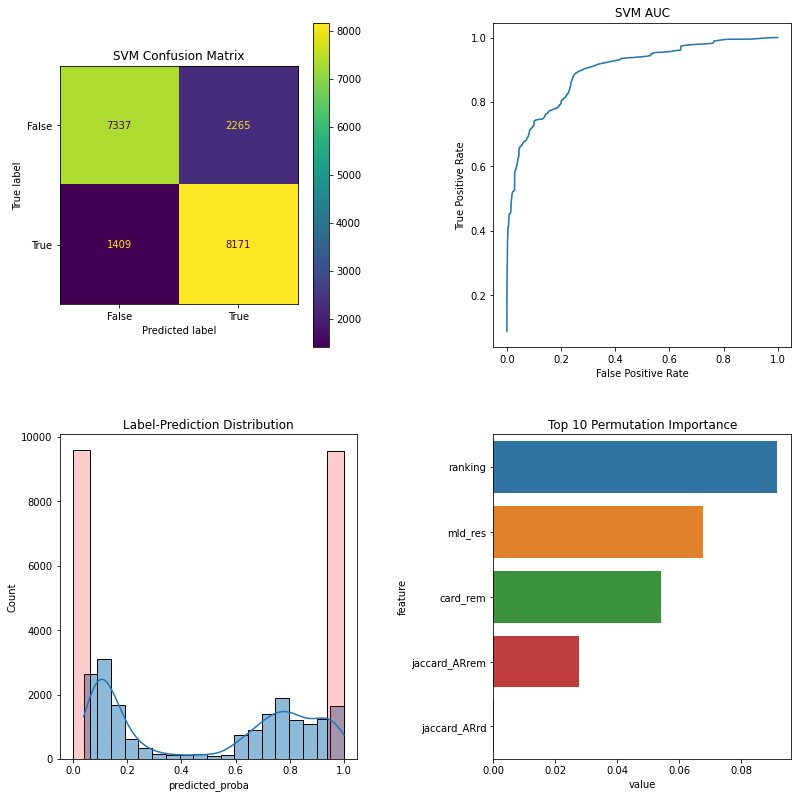

In [52]:
## ref: https://www.kaggle.com/code/irfandahusnisahid/customer-churn-prediction-using-xgboost


fig,ax = plt.subplots(2,2,figsize=(12,12))
confusion_matrix = metrics.confusion_matrix(y_test1.label, y_test1.predicted)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot(ax=ax[0,0])
ax[0,0].set_title("SVM Confusion Matrix")

fpr, tpr, _ = metrics.roc_curve(y_test1.label, y_test1.predicted_proba)
sns.lineplot(fpr,tpr,ax=ax[0,1])
ax[0,1].set_xlabel('False Positive Rate')
ax[0,1].set_ylabel('True Positive Rate')
ax[0,1].set_title("SVM AUC")

sns.histplot(y_test1.predicted_proba,kde=True,ax=ax[1,0])
sns.histplot(y_test1.label,kde=False,ax=ax[1,0], color="red",alpha=0.2)
ax[1,0].set_title("Label-Prediction Distribution")

sns.barplot(data=permutation_importance.iloc[0:5],x="value",y="feature",ax=ax[1,1])
ax[1,1].set_title("Top 10 Permutation Importance")

fig.tight_layout(pad=4.0)
plt.show()

In [58]:
y_test1

,label,predicted,predicted_proba
76712,0.0,1.0,0.748794
74961,0.0,0.0,0.065330
24886,1.0,1.0,0.758222
24305,1.0,1.0,0.713162
67472,0.0,0.0,0.075002
...,...,...,...
44765,1.0,1.0,0.914267
89610,0.0,0.0,0.184781
64237,0.0,0.0,0.099860
49437,0.0,0.0,0.113715


In [59]:
# Predict using training and testing data and display the accuracy, f-1 score, precision for Positive and Negative Sentiment Classifiers 


## Otherwise, use these commands:
svm_preds = svm_est.predict(X_test1)

report = metrics.classification_report(y_test1.label,svm_preds, output_dict=True)
data_report = pd.DataFrame(report).transpose().round(2)
cm = sns.light_palette("brown", as_cmap=True)
data_report.style.background_gradient(cmap=cm)

,precision,recall,f1-score,support
0.0,0.840000,0.760000,0.800000,9602.000000
1.0,0.780000,0.850000,0.820000,9580.000000
accuracy,0.810000,0.810000,0.810000,0.810000
macro avg,0.810000,0.810000,0.810000,19182.000000
weighted avg,0.810000,0.810000,0.810000,19182.000000


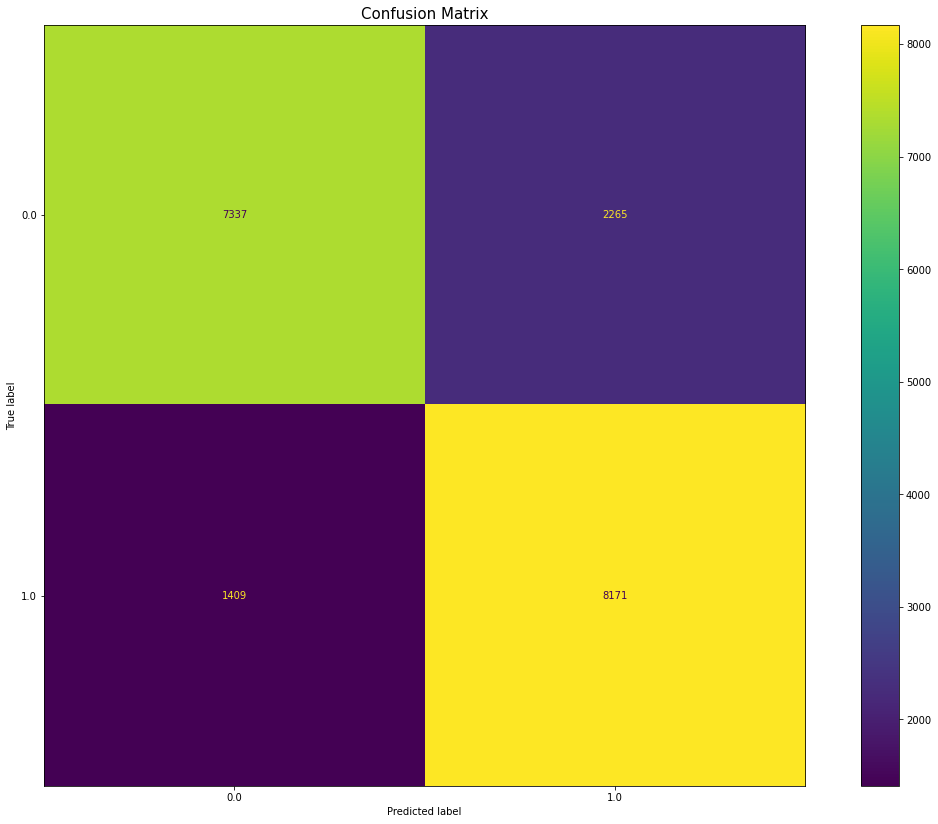

In [60]:
# First type of Confusion matrix

cm = metrics.confusion_matrix(y_test1.label, svm_preds, labels=svm_est.classes_)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm,  display_labels=svm_est.classes_ ) #cmap='RdBu_r'

disp.plot()
plt.title('Confusion Matrix',  fontsize = 15)
plt.gcf().set_size_inches((20, 14))
plt.show()

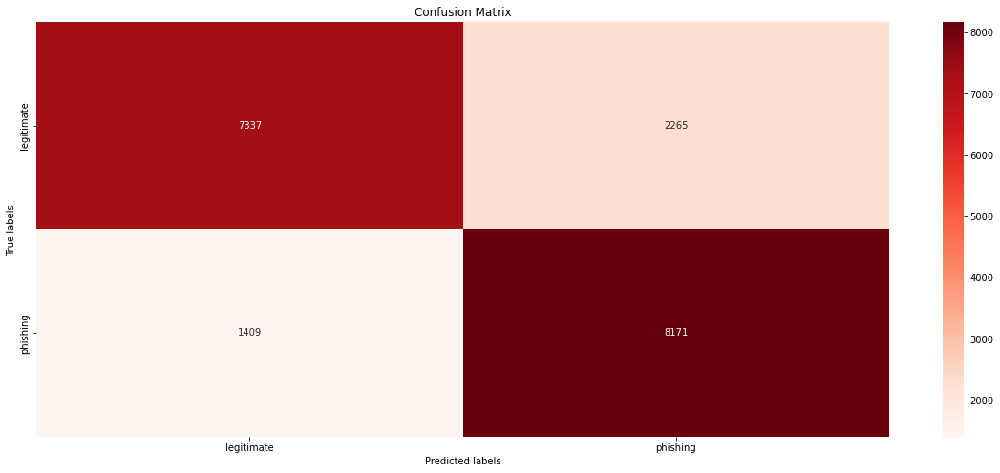

In [62]:
# Second type of confusion matrix

ax= plt.subplot()
cm= metrics.confusion_matrix(y_test1.label,svm_preds)
sns.heatmap(cm, annot=True, fmt='g', ax=ax,cmap='Reds');  
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(['legitimate', 'phishing']); ax.yaxis.set_ticklabels(['legitimate',  'phishing']);   
plt.gcf().set_size_inches((20, 8))
plt.show()

In [63]:
import plotly.figure_factory as ff

x_axes = ['legitimate', 'phishing']
y_axes =  [ 'phishing', 'legitimate']

def conf_matrix(z, x=x_axes, y=y_axes):
    
    z = np.flip(z, 0)

    # change each element of z to type string for annotations
    z_text = [[str(y) for y in x] for x in z]

    # set up figure 
    fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z_text, colorscale='Viridis')

    # add title
    fig.update_layout(title_text='<b>Confusion matrix</b>',
                      xaxis = dict(title='Predicted value'),
                      yaxis = dict(title='Real value')
                     )

    # add colorbar
    fig['data'][0]['showscale'] = True
    
    return fig

In [65]:
# Third type of confusion Matrix

conf_matrix(metrics.confusion_matrix(y_test1.label, svm_preds))


In [ ]:
'''
For CM:

supported values are:
'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 
'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 
'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 
'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 
'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 
'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 
'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 
'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 
'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 
'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 
'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 
'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 
'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r',
'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magm..





'''

> #### Save the XGB model 

In [66]:
import pickle 


filename = "svm_est_ph.sav"

# Save the trained model as a pickle string.
pickle.dump(svm_est,open(filename, "wb") )

## Load the pickled model
svm_from_pickle = pickle.load(open(filename, "rb"))


# Use the loaded pickled model to make predictions
print("*************  The model results:  ***********\n", svm_from_pickle.predict(X_test))




*************  The model results:  ***********
 [1. 0. 1. ... 0. 0. 0.]


> ## Random Forest evaluation

In [33]:
# feature_importance

feature_importance = pd.DataFrame()
feature_importance["feature"] = X.columns
feature_importance["value"] = rf_est.feature_importances_
feature_importance = feature_importance.sort_values("value", ascending=False).reset_index(drop=True)


In [57]:
metrics.roc_auc_score( y_test2.label, y_test2.predicted_proba )

0.9682379747347347

In [54]:
scores_model.append({'Model': 'Random Forest','AUC_Score': roc_auc( y_test2.predicted_proba,y_test2.label)}) 

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



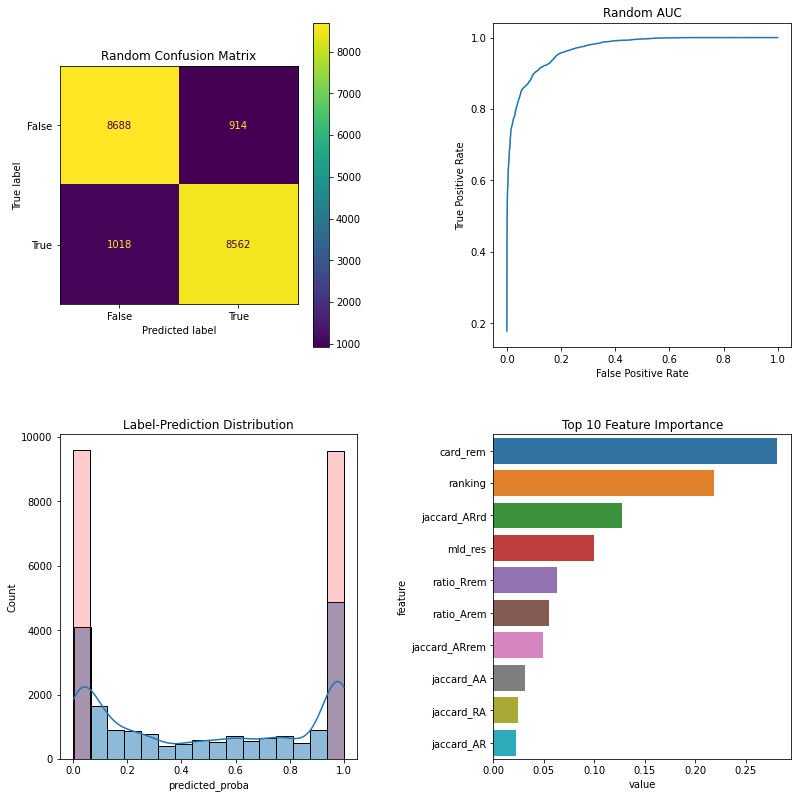

In [34]:
## ref: https://www.kaggle.com/code/irfandahusnisahid/customer-churn-prediction-using-xgboost


fig,ax = plt.subplots(2,2,figsize=(12,12))
confusion_matrix = metrics.confusion_matrix(y_test2.label, y_test2.predicted)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot(ax=ax[0,0])
ax[0,0].set_title("Random Confusion Matrix")

fpr, tpr, _ = metrics.roc_curve(y_test2.label, y_test2.predicted_proba)
sns.lineplot(fpr,tpr,ax=ax[0,1])
ax[0,1].set_xlabel('False Positive Rate')
ax[0,1].set_ylabel('True Positive Rate')
ax[0,1].set_title("Random AUC")

sns.histplot(y_test2.predicted_proba,kde=True,ax=ax[1,0])
sns.histplot(y_test2.label,kde=False,ax=ax[1,0], color="red",alpha=0.2)
ax[1,0].set_title("Label-Prediction Distribution")

sns.barplot(data=feature_importance.iloc[0:10],x="value",y="feature",ax=ax[1,1])
ax[1,1].set_title("Top 10 Feature Importance")

fig.tight_layout(pad=4.0)
plt.show()

In [35]:
y_test2

,label,predicted,predicted_proba
76712,0.0,0.0,0.471264
74961,0.0,0.0,0.005532
24886,1.0,1.0,0.639901
24305,1.0,1.0,0.665383
67472,0.0,0.0,0.003171
...,...,...,...
44765,1.0,1.0,0.983399
89610,0.0,0.0,0.184652
64237,0.0,0.0,0.025455
49437,0.0,0.0,0.013160


In [37]:
# Predict using training and testing data and display the accuracy, f-1 score, precision for Positive and Negative Sentiment Classifiers 

## If you're using the second cleaning, you can use the following command:
#xgb_predictions = xgb_est.predict(tvec.transform(X_test_cleaned))   

## Otherwise, use these commands:
rf_preds = rf_est.predict(X_test2)

report = metrics.classification_report(y_test2.label,rf_preds, output_dict=True)
data_report = pd.DataFrame(report).transpose().round(2)
cm = sns.light_palette("red", as_cmap=True)
data_report.style.background_gradient(cmap=cm)

,precision,recall,f1-score,support
0.0,0.900000,0.900000,0.900000,9602.000000
1.0,0.900000,0.890000,0.900000,9580.000000
accuracy,0.900000,0.900000,0.900000,0.900000
macro avg,0.900000,0.900000,0.900000,19182.000000
weighted avg,0.900000,0.900000,0.900000,19182.000000


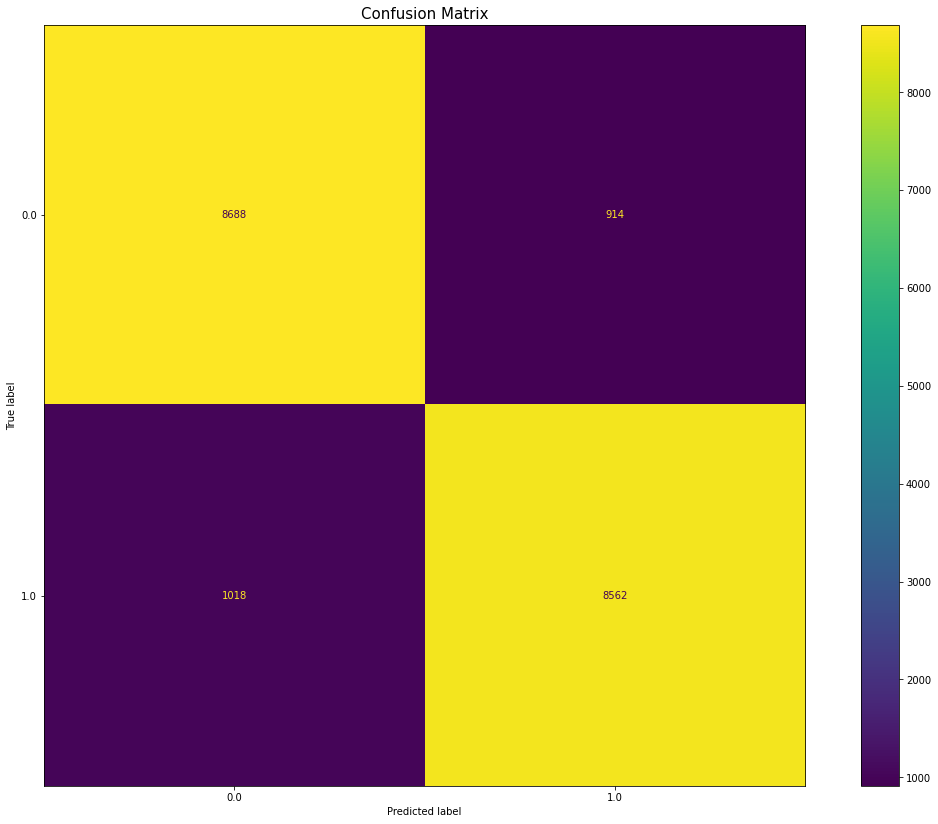

In [38]:
# First type of Confusion matrix

cm = metrics.confusion_matrix(y_test2.label, rf_preds, labels=rf_est.classes_)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm,  display_labels=rf_est.classes_ ) #cmap='RdBu_r'

disp.plot()
plt.title('Confusion Matrix',  fontsize = 15)
plt.gcf().set_size_inches((20, 14))
plt.show()

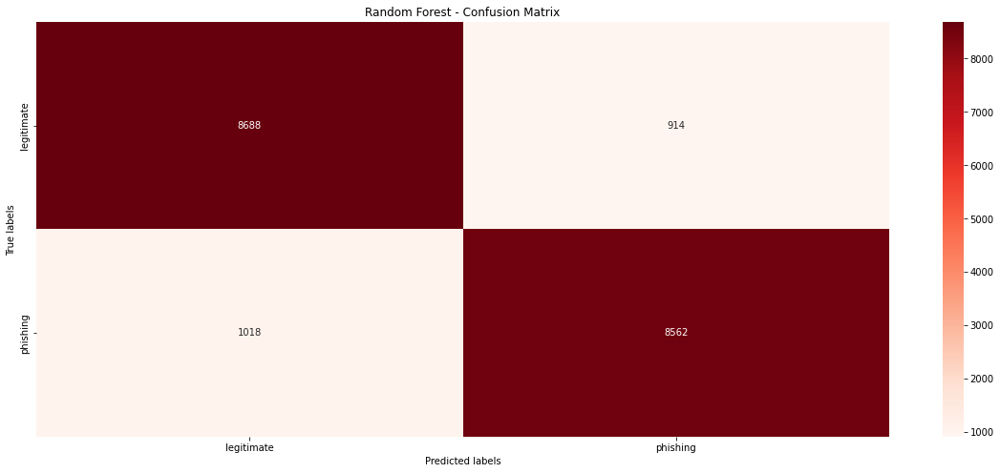

In [39]:
# Second type of confusion matrix

ax= plt.subplot()
cm= metrics.confusion_matrix(y_test2.label,rf_preds)
sns.heatmap(cm, annot=True, fmt='g', ax=ax,cmap='Reds');  
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Random Forest - Confusion Matrix');
ax.xaxis.set_ticklabels(['legitimate', 'phishing']); ax.yaxis.set_ticklabels(['legitimate', 'phishing']);
plt.gcf().set_size_inches((20, 8))
plt.show()

In [40]:
import plotly.figure_factory as ff

x_axes = ['legitimate', 'phishing']
y_axes =  ['phishing', 'legitimate']

def conf_matrix(z, x=x_axes, y=y_axes):
    
    z = np.flip(z, 0)

    # change each element of z to type string for annotations
    z_text = [[str(y) for y in x] for x in z]

    # set up figure 
    fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z_text, colorscale='Viridis')

    # add title
    fig.update_layout(title_text='<b>Random Forest - Confusion matrix</b>',
                      xaxis = dict(title='Predicted value'),
                      yaxis = dict(title='Real value'),
                      
                     )

    # add colorbar
    fig['data'][0]['showscale'] = True
    
    return fig

In [41]:
# Third type of confusion Matrix

conf_matrix(metrics.confusion_matrix(y_test2.label, rf_preds))


In [ ]:
'''
For CM:

supported values are:
'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 
'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 
'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 
'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 
'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 
'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 
'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 
'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 
'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 
'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 
'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 
'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 
'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r',
'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magm..





'''

> #### Save the XGB model 

In [42]:
import pickle 


filename = "rf_est_ph.sav"

# Save the trained model as a pickle string.
pickle.dump(rf_est,open(filename, "wb") )

## Load the pickled model
rf_from_pickle = pickle.load(open(filename, "rb"))


# Use the loaded pickled model to make predictions
print("*************  The model results:  ***********\n", rf_from_pickle.predict(X_test))




*************  The model results:  ***********
 [0. 0. 1. ... 0. 0. 0.]


> ## Results

In [67]:
# Visualization of Results obtained from various machine models
results = pd.DataFrame(scores_model).sort_values(by='AUC_Score',ascending=False)
results.style.background_gradient(cmap='Blues')

,Model,AUC_Score
2,Random Forest,0.968238
0,XGBoost,0.954345
1,SVM,0.899263
